# Predicting Housing Prices in King County, WA

**Author:** Mitch Krieger
***

## Overview
Using a pre-existing given data set, the goal of this project is to make a linear regression model that predicts a holdout dataset of sale prices using various features and statistical tests.
***
## Step 1: Read in Data

In [562]:
import pandas as pd

houses_train = pd.read_csv('data/kc_house_data_train.csv',index_col=0)
houses_test = pd.read_csv('data/kc_house_data_test_features.csv',index_col=0)

## Step 2: Exploratory Data Analysis
Dataset contains 20 columns with no `np.nan` missing values:

In [563]:
houses_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17290 entries, 0 to 17289
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             17290 non-null  int64  
 1   date           17290 non-null  object 
 2   price          17290 non-null  float64
 3   bedrooms       17290 non-null  int64  
 4   bathrooms      17290 non-null  float64
 5   sqft_living    17290 non-null  int64  
 6   sqft_lot       17290 non-null  int64  
 7   floors         17290 non-null  float64
 8   waterfront     17290 non-null  int64  
 9   view           17290 non-null  int64  
 10  condition      17290 non-null  int64  
 11  grade          17290 non-null  int64  
 12  sqft_above     17290 non-null  int64  
 13  sqft_basement  17290 non-null  int64  
 14  yr_built       17290 non-null  int64  
 15  yr_renovated   17290 non-null  int64  
 16  zipcode        17290 non-null  int64  
 17  lat            17290 non-null  float64
 18  long  

Using a pair plot to begin to explore data trends:

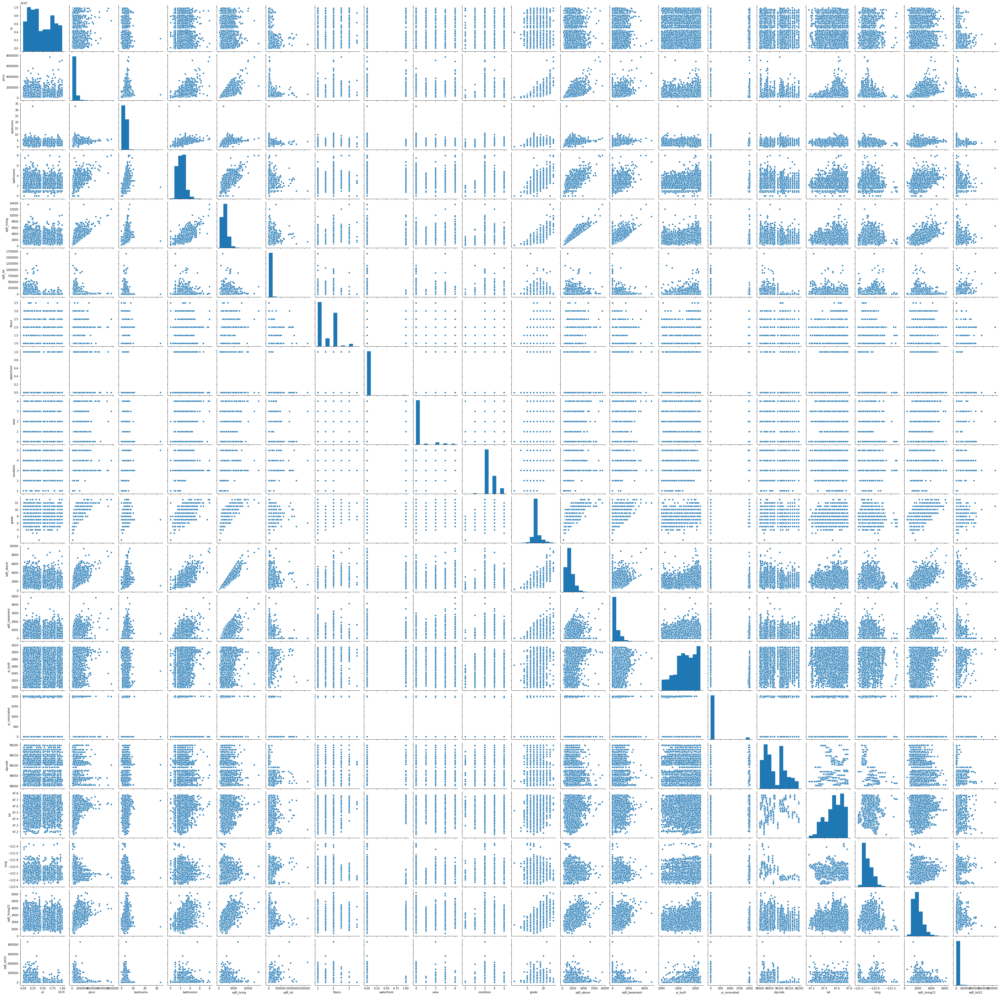

In [132]:
import matplotlib.pyplot as plt
import seaborn as sns

# pair plot of all variables
sns.pairplot(houses_train)

Observations from above pairplot indicate that: 
- floors, view, condition, grade, waterfront, condition and zipcode as categorical, and waterfront is binary
- major outliers in bedrooms and price causing large distortions 
- other outliers in sqft_living and sqft_lot
***
Creating a heat map of correlations to vizualize any potential multicolinearity:

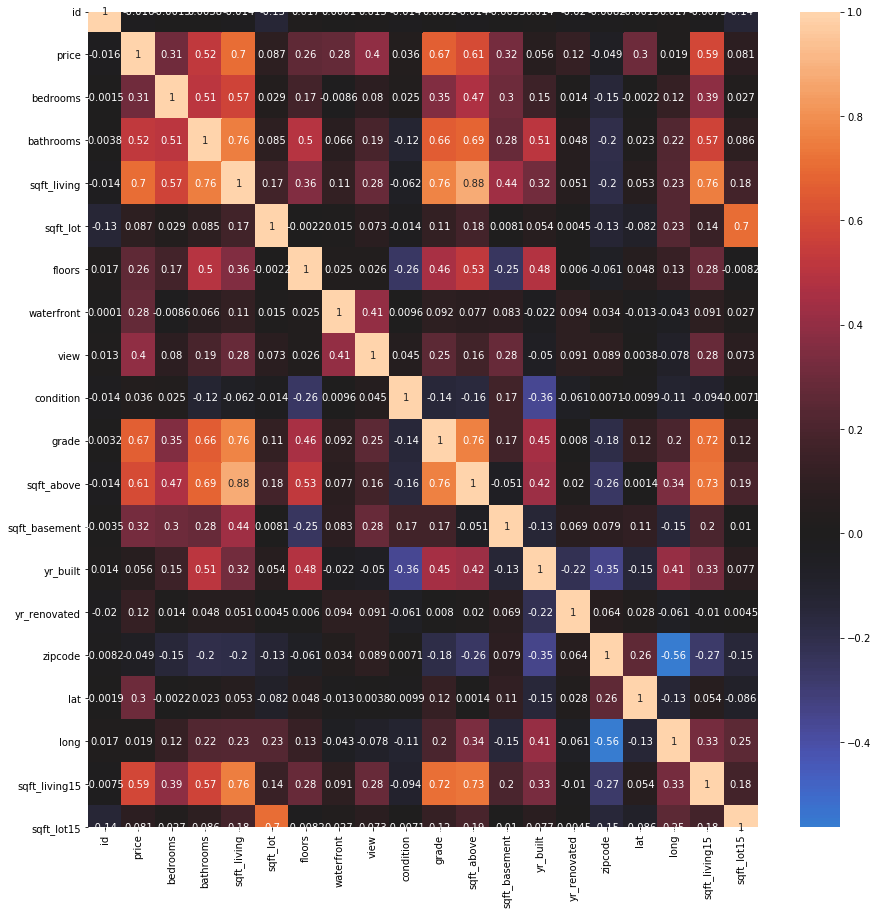

In [529]:
figure = plt.figure(figsize=(15,15))
sns.heatmap(houses_train.corr(),center = 0, annot=True)

Using the above to identify possible areas of multicolinearity:
- sqft_living, sqft_above, sqft_living15, bedrooms, bathrooms and grade all are at least somewhat correlated with each other
- specifically: sqft_living is highly correlated with bedrooms bathrooms, and grade
***
Basic describe for each feature to identify other data issues:

In [564]:
houses_train.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,1.729000e+04,1.729000e+04,17290.000000,17290.000000,17290.000000,1.729000e+04,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000
mean,4.565502e+09,5.407395e+05,3.372470,2.111943,2081.464604,1.524340e+04,1.490312,0.007981,0.238519,3.408502,7.654425,1789.306015,292.158589,1970.792019,83.806304,98078.193175,47.560058,-122.214258,1987.986698,12873.475824
std,2.874656e+09,3.733190e+05,0.939346,0.770476,920.018539,4.230462e+04,0.538909,0.088985,0.775229,0.651296,1.174718,829.265107,443.151874,29.343516,400.329376,53.607949,0.138412,0.140857,684.802635,27227.437583
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.720000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,659.000000
25%,2.114701e+09,3.210000e+05,3.000000,1.500000,1430.000000,5.081250e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1951.000000,0.000000,98033.000000,47.471200,-122.329000,1490.000000,5111.250000
50%,3.903650e+09,4.500000e+05,3.000000,2.250000,1920.000000,7.642000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1974.000000,0.000000,98065.000000,47.571600,-122.230000,1840.000000,7622.500000
75%,7.301150e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.072575e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2214.500000,560.000000,1996.000000,0.000000,98118.000000,47.677900,-122.126000,2360.000000,10101.750000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,858132.000000


## Step 3: Clean up any issues
Identifying issues/curiosities and cleaning up:
- Date is a string instead of numerical; clean by converting to date time
- `yr_renovated` uses zero to indicate not renovated; create new feature "years since updated"
- bedrooms has a huge outlier at 33; will keep incase of similar outlier in holdout data
- zipcode, latitude, longitude are somewhat meaningless geolocators: people don't buy houses based on these things, they buy based on the city/neighborhood; create new feature "municipality"
- Houses that were sold before they were built??? possible...
- Certain places have no bathrooms (boarding house??? cabin?) or bedrooms (studio apts?)

In [565]:
#changing date to datetime object
import datetime as dt

#Cut out timestamp
houses_train['date'] = houses_train['date'].str.slice(stop=8)

#convert to datetime
houses_train['date'] = pd.to_datetime(houses_train['date'], errors='coerce', yearfirst=True)
houses_train['month_sold'] = houses_train['date'].apply(lambda x:x.month)

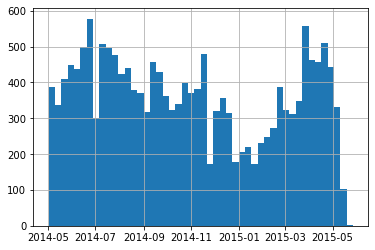

In [566]:
houses_train.date.hist(bins=48)

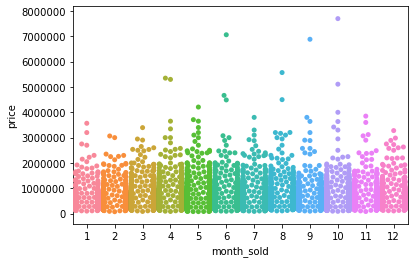

In [567]:
sns.swarmplot(houses_train.month_sold,houses_train.price)

In [568]:
houses_train.date.dt.year

0        2014
1        2014
2        2014
3        2015
4        2014
         ... 
17285    2015
17286    2014
17287    2014
17288    2014
17289    2015
Name: date, Length: 17290, dtype: int64

In [569]:
import folium
import geopandas as gpd

m = folium.Map(location = [47.549,-121.9836])

houses_train['coords'] = list(zip(houses_train.lat, houses_train.long))

for point in houses_train['coords']:
    folium.CircleMarker(point,radius=.01).add_to(m)
    
m

/Users/mitchellkrieger/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Text(0.5, 1, 'Housing Prices in King County 2014-2015')

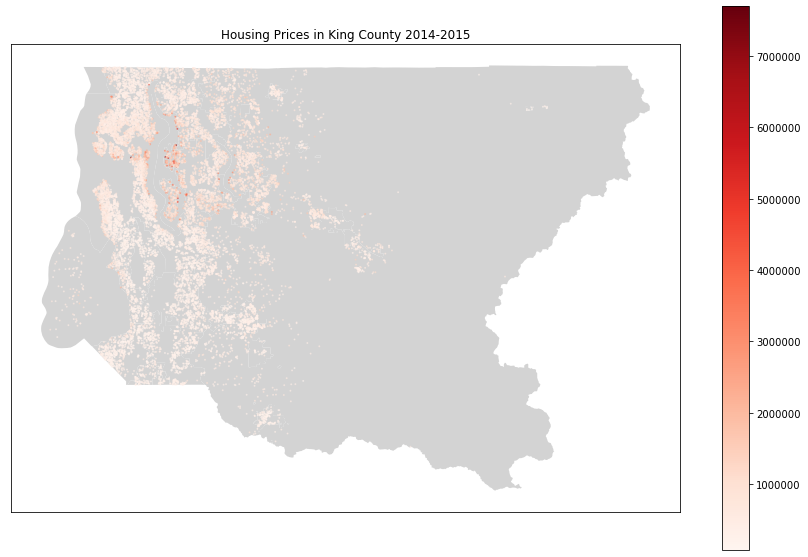

In [570]:
kingcounty = gpd.GeoDataFrame.from_file("data/Cities_and_Unincorporated_King_County___city_kc_area-shp/")

geo_houses_train = gpd.GeoDataFrame(houses_train, geometry= gpd.points_from_xy(houses_train.long,houses_train.lat))

geo_houses_train.crs = {'init':'epsg:4326'}

fig = plt.figure(figsize=(15,10))
ax = plt.gca()
kingcountyplot = kingcounty.plot(color='lightgrey',ax=ax)
housesplot = geo_houses_train.plot(markersize=1,alpha=.5,column='price',legend='True',cmap='Reds',ax=ax)

ax.set_yticks([])
ax.set_xticks([])
ax.set_title('Housing Prices in King County 2014-2015')

## Step 4: Feature Engineering
Years old:

In [571]:
houses_train['yrs_old'] = houses_train.date.dt.year - houses_train.yr_built
houses_train.yrs_old.value_counts()

 9      363
 11     351
 0      350
 10     345
 8      338
 7      327
 37     314
 47     302
 36     296
 46     269
 35     254
 38     252
 55     251
 25     250
 6      245
 60     244
 13     242
 52     241
 27     239
 1      232
 48     226
 24     216
 53     212
 15     212
 26     209
 12     207
 64     206
 59     203
 45     202
 54     198
 16     197
 61     195
 34     192
 67     190
 62     190
 28     189
 51     188
 66     187
 56     186
 30     185
 23     185
 21     184
 31     181
 63     178
 29     178
 58     177
 20     176
 49     176
 14     175
 72     166
 57     164
 18     163
 22     157
 73     154
 17     153
 65     153
 39     150
 5      145
 89     143
 2      141
 68     141
 40     140
 42     137
 19     134
 88     131
 33     127
 71     126
 50     126
 74     126
 3      123
 90     123
 32     107
 87     107
 41     106
 70     104
 44      98
 86      97
 75      96
 105     94
 104     88
 4       86
 96      82
 69      82
 85 

#### Years since last renovation or build if not renovated:

In [572]:
import numpy as np
houses_train['yrs_last_ren'] = houses_train.date.dt.year - houses_train.yr_renovated
conditions = [houses_train.yrs_last_ren == 2015,
             houses_train.yrs_last_ren == 2014]
choices = [0,0]
houses_train['yrs_last_ren'] = np.select(conditions,choices,default=houses_train['yrs_last_ren'])

#### Renovated or Not:

In [573]:
houses_train['renovated'] = np.where(houses_train.yr_renovated == 0,0,1)

#### Bedrooms per bathroom: 
(could indicate the number of people who have to share a bathroom)

In [574]:
houses_train['bed_per_bath'] = houses_train.bedrooms / houses_train.bathrooms
conditions = [houses_train.bed_per_bath == np.nan,
             houses_train.bed_per_bath == np.inf,
             houses_train.bed_per_bath.isna()]
choices = [0,0,0]
houses_train['bed_per_bath'] = np.select(conditions,choices,default=houses_train['bed_per_bath'])

#### sqft_living per bedroom 
(could indicate the number of extra rooms (den, library, office, playroom, etc) or space per person

In [575]:
houses_train['sqft_per_bed'] = houses_train.sqft_living / houses_train.bedrooms
conditions = [houses_train.sqft_per_bed == np.nan,
             houses_train.sqft_per_bed == np.inf,
             houses_train.sqft_per_bed.isna()]
choices = [0,0,0]
houses_train['sqft_per_bed'] = np.select(conditions,choices,default=houses_train['sqft_per_bed'])

#### Using Longitute & Latitude to identify City/Neighborhood:

In [576]:
from geopy.geocoders import Nominatim
import requests

#testing
geolocator = Nominatim(user_agent='mitkrieger@gmail.com')
print(geolocator.reverse('47.6364752, -122.3567059').raw['address']['suburb'])

from geopy.extra.rate_limiter import RateLimiter
geocode = RateLimiter(geolocator.reverse, min_delay_seconds=.000001)

Queen Anne


In [577]:
import reverse_geocode
houses_train['location'] = reverse_geocode.search(list(houses_train['coords']))

In [578]:
houses_train['city'] = houses_train['location'].apply(lambda x: x['city'])

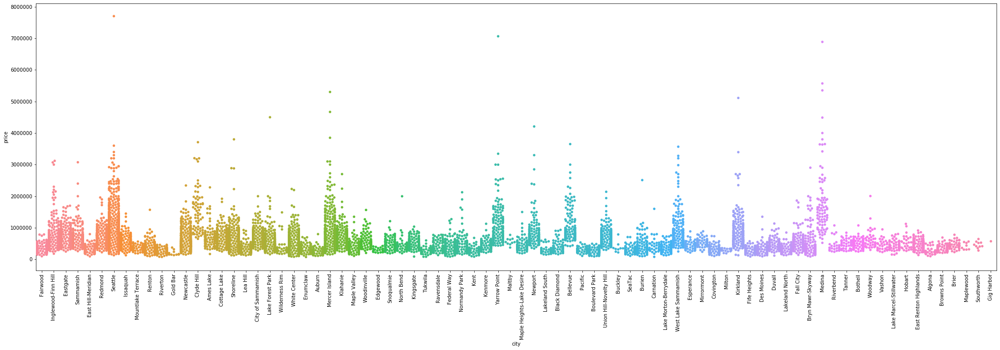

In [545]:
figure = plt.figure(figsize=(35,10))
sns.swarmplot(x='city',y='price',data=houses_train)
ax=plt.gca()
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

plt.show()

#### Scaling Latitude & Longitude

In [595]:
from sklearn.preprocessing import StandardScaler

stdScle = StandardScaler()

#Set X to features
X = houses_train[['lat','long']]

#scale using stdScale
X_scaled = stdScle.fit_transform(X)

houses_train['stdscaled_lat'] = X_scaled[:, 0]
houses_train['stdscaled_long'] = X_scaled[:, 1]

#### City Dummies

In [596]:
from sklearn.preprocessing import OneHotEncoder

#encoder for dummy variables
cat_encoder2 = OneHotEncoder()
city_dummies = cat_encoder.fit_transform(houses_train[['city']])

#turn spaces and dashes in column names to underscores
city_names = []
for city in cat_encoder.categories_[0].tolist():
    city_names.append(city.replace(' ','_').replace('-','_'))

#create dummy dataframe and concat with original dataframe
dummy_df = pd.DataFrame(city_dummies.toarray(),columns=city_names)
houses_train_dumb = pd.concat([houses_train,dummy_df],axis=1) 

#### Zipcode Dummbies

In [597]:
# cat_encoder2 = OneHotEncoder()
# zipcode_dummies = cat_encoder2.fit_transform(houses_train[['zipcode']])

# zipcodes = []
# for zipcode in cat_encoder2.categories_[0].tolist():
#     zipcodes.append(str(zipcode))

# dummy_df = pd.DataFrame(zipcode_dummies.toarray(),columns=zipcodes)
# houses_train_dumb = pd.concat([houses_train_dumb,dummy_df],axis=1) 

## Step 5: Train-Test Split & Initial Model

In [598]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from statsmodels.formula.api import ols

train_set, test_set = train_test_split(houses_train_dumb, test_size=.2, random_state=123)
print(len(train_set), "train +", len(test_set), "test = ",len(houses_train))

13832 train + 3458 test =  17290


In [599]:
train_set.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view',
       ...
       'Tanner', 'Tukwila', 'Union_Hill_Novelty_Hill', 'Vashon',
       'West_Lake_Sammamish', 'White_Center', 'Wilderness_Rim', 'Woodinville',
       'Woodway', 'Yarrow_Point'],
      dtype='object', length=113)

#### Model 0: Dummy using all given features

In [600]:
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_squared_error

dummy = DummyRegressor()

X_train = train_set.copy()[['bedrooms','bathrooms', 'sqft_living', 'sqft_lot', 'floors', 
                            'waterfront', 'view', 'condition', 'grade', 'sqft_above', 
                            'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
                            'sqft_living15','sqft_lot15','month_sold']]

y_train = train_set.copy()['price']

dummy.fit(X_train,y_train)

y_pred = dummy.predict(X_train)

dummy_rmse = mean_squared_error(y_train,y_pred,squared=False)
dummy_rmse

371829.68491779856

#### Model 1: Using all given features

In [623]:
def reg_formula(outcome,features):
    """
    Takes in outcome and features and returns linear regression formula in r
    
    Outcome: String of title of outcome column
    features: list of strings of feature columns
    """
    
    pred_sum = '+'.join(features)
    return outcome + '~' + pred_sum

def sm_reg(outcome,features,dataset):
    """
    Takes in outcome, features and data set and returns linear regression summary table using statsmodels
    
    outcome: String of title of outcome column
    features: list of strings of feature columns
    dataset: pandas dataframe containing columns that include outcome and features as titles to train model on
    """
    formula = reg_formula(outcome,dataset[features])
    regression = ols(formula=formula,data=dataset).fit()
    return regression.summary()

def sk_rsme(outcome,features,train_set,test_set):
    """
    Takes in outcome, features and dataset and returns rsme using sklearn
    
    outcome: String of title of outcome column
    features: list of strings of feature columns
    train_set: pandas dataframe containing columns that include outcome and features as titles to train model on
    test_set: pandas dataframe containing columns that include outcome and features as titles to test model on
    """
    lr = LinearRegression()

    X_train = train_set[features]

    y_train = train_set[outcome]

    lr.fit(X_train,y_train)
    
    X_test = test_set[features]
    
    y_test = test_set[outcome]

    y_train_pred = lr.predict(X_train)
    
    y_test_pred = lr.predict(X_test)

    rmse_train =  mean_squared_error(y_train,y_train_pred,squared=False)
    rmse_test = mean_squared_error(y_test,y_test_pred,squared=False)
    
    return rmse_train, rmse_test

In [624]:
reg1_features = ['bedrooms','bathrooms', 'sqft_living', 'sqft_lot', 'floors', 
                            'waterfront', 'view', 'condition', 'grade', 'sqft_above', 
                            'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
                            'sqft_living15','sqft_lot15','month_sold']

outcome = 'price'

#model using stats models
regression1 = sm_reg(outcome,reg1_features,train_set)
regression1

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.699
Model:                            OLS   Adj. R-squared:                  0.698
Method:                 Least Squares   F-statistic:                     1884.
Date:                Wed, 21 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:42:44   Log-Likelihood:            -1.8874e+05
No. Observations:               13832   AIC:                         3.775e+05
Df Residuals:                   13814   BIC:                         3.777e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -3.801e+07      2e+06    -18.962      0.000   -4.19e+07   -3.41e+07
bedrooms      -2.899e+04   2313.743    -12.529      0.000   -3.35e+04   -2.45e+04
bathrooms      4.193e+04   4116.139     10.186      0.000    3.39e+04       5e+04
sqft_living     103.8390      2.847     36.476      0.000      98.259     109.419
sqft_lot          0.1348      0.058      2.314      0.021       0.021       0.249
floors          205.9642   4517.509      0.046      0.964   -8648.966    9060.894
waterfront     5.733e+05    2.1e+04     27.360      0.000    5.32e+05    6.14e+05
view           5.156e+04   2667.412     19.331      0.000    4.63e+04    5.68e+04
condition      3.116e+04   2945.630     10.579      0.000    2.54e+04    3.69e+04
grade          9.973e+04   2720.769     36.653      0.000    9.44e+04    1.05e+05
sqft_above       70.5372      2.855     24.709      0.000      64.942      76.133
sqft_basement    33.3017      3.338      9.977      0.000      26.759      39.844
yr_built      -2522.9922     90.896    -27.757      0.000   -2701.160   -2344.824
yr_renovated     22.5805      4.678      4.827      0.000      13.412      31.749
lat            5.689e+05   1.33e+04     42.711      0.000    5.43e+05    5.95e+05
long          -1.243e+05   1.51e+04     -8.247      0.000   -1.54e+05   -9.47e+04
sqft_living15    31.4701      4.343      7.245      0.000      22.956      39.984
sqft_lot15       -0.3472      0.092     -3.791      0.000      -0.527      -0.168
month_sold    -2691.1605    557.120     -4.830      0.000   -3783.191   -1599.130
==============================================================================
Omnibus:                    11817.032   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1195269.128
Skew:                           3.587   Prob(JB):                         0.00
Kurtosis:                      47.972   Cond. No.                     2.60e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 5.44e-22. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

`sqft_living15`, `sqft_lot15`,`floors`, and  `sqft_lot` all have p-values greater than the typical alpha/significance threshold of $\alpha=0.5$. As a result, might drop these features in future models

In [625]:
#validation & RMSE using sklearn
reg1_rmse_train, reg1_rmse_test = sk_rsme('price',reg1_features,train_set,test_set)
print("Train rmse: ",reg1_rmse_train,"\nTest rmse: ", reg1_rmse_test)

Train rmse:  204119.16198165814 
Test rmse:  215198.7677272051


#### Model 2: Remove statistically insignificant coefficents and drop coefficents due to possible multicolinearity
Dropping `sqft_living15`, `sqft_lot15`,`floors`,`yr_renovated` and  `sqft_lot` due no statistcal significance and `sq_above`,`bathrooms`, due to multicolinearity with `sqft_living`

In [628]:
#model 2 using statsmodels
reg2_features = ['bedrooms', 'sqft_living', 'sqft_lot', 
                                'waterfront', 'view', 'condition', 'sqft_basement', 
                                  'yr_built', 'lat', 'long','month_sold']

outcome = 'price'

#model
regression2 = sm_reg(outcome,reg2_features,train_set)
regression2

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.656
Model:                            OLS   Adj. R-squared:                  0.655
Method:                 Least Squares   F-statistic:                     2393.
Date:                Wed, 21 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:46:24   Log-Likelihood:            -1.8966e+05
No. Observations:               13832   AIC:                         3.794e+05
Df Residuals:                   13820   BIC:                         3.794e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -5.242e+07   1.99e+06    -26.304      0.000   -5.63e+07   -4.85e+07
bedrooms      -3.546e+04   2412.315    -14.699      0.000   -4.02e+04   -3.07e+04
sqft_living     314.6933      2.993    105.127      0.000     308.826     320.561
sqft_lot         -0.0930      0.046     -2.043      0.041      -0.182      -0.004
waterfront      5.49e+05   2.23e+04     24.602      0.000    5.05e+05    5.93e+05
view           7.008e+04   2792.429     25.098      0.000    6.46e+04    7.56e+04
condition      3.313e+04   3088.418     10.727      0.000    2.71e+04    3.92e+04
sqft_basement   -89.4181      5.089    -17.571      0.000     -99.393     -79.443
yr_built      -1248.1759     78.943    -15.811      0.000   -1402.915   -1093.437
lat            6.803e+05   1.39e+04     49.080      0.000    6.53e+05    7.08e+05
long          -1.836e+05   1.53e+04    -12.035      0.000   -2.14e+05   -1.54e+05
month_sold    -2709.5773    595.136     -4.553      0.000   -3876.125   -1543.029
==============================================================================
Omnibus:                     9701.848   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           504701.589
Skew:                           2.793   Prob(JB):                         0.00
Kurtosis:                      32.061   Cond. No.                     4.86e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.86e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [629]:
#validation & RMSE using sklearn
reg2_rmse_train, reg2_rmse_test = sk_rsme('price',reg2_features,train_set,test_set)
print("Train rmse: ",reg2_rmse_train,"\nTest rmse: ", reg2_rmse_test)

Train rmse:  218165.44697983513 
Test rmse:  223063.4592598037


#### Model 3: Adding in engineered features

In [636]:
#model 3 using statsmodels
reg3_features = ['bedrooms', 'bathrooms', 'sqft_living',
                            'waterfront', 'view', 'condition', 'grade', 
                            'sqft_basement', 'yr_built', 'lat', 'long','month_sold', 'renovated',
                                'yrs_old', 'yrs_last_ren', 'bed_per_bath', 'sqft_per_bed']

outcome = 'price'

#model
regression3 = sm_reg(outcome,reg3_features,train_set)
regression3

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.707
Model:                            OLS   Adj. R-squared:                  0.706
Method:                 Least Squares   F-statistic:                     1958.
Date:                Wed, 21 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:50:10   Log-Likelihood:            -1.8856e+05
No. Observations:               13832   AIC:                         3.771e+05
Df Residuals:                   13814   BIC:                         3.773e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -9.814e+07    1.2e+07     -8.156      0.000   -1.22e+08   -7.45e+07
bedrooms       -1.15e+05   5014.871    -22.924      0.000   -1.25e+05   -1.05e+05
bathrooms      1.157e+05   6974.560     16.585      0.000    1.02e+05    1.29e+05
sqft_living     253.0506      6.997     36.167      0.000     239.336     266.765
waterfront     5.906e+05   2.07e+04     28.471      0.000     5.5e+05    6.31e+05
view           5.355e+04   2603.276     20.572      0.000    4.85e+04    5.87e+04
condition      3.594e+04   2914.940     12.328      0.000    3.02e+04    4.16e+04
grade          1.071e+05   2567.769     41.715      0.000    1.02e+05    1.12e+05
sqft_basement   -33.4546      4.882     -6.852      0.000     -43.024     -23.885
yr_built       2.904e+04   5895.487      4.926      0.000    1.75e+04    4.06e+04
lat            5.786e+05    1.3e+04     44.398      0.000    5.53e+05    6.04e+05
long          -9.202e+04    1.4e+04     -6.568      0.000   -1.19e+05   -6.46e+04
month_sold      989.2531    880.271      1.124      0.261    -736.198    2714.705
renovated      1.106e+05   1.36e+04      8.114      0.000    8.39e+04    1.37e+05
yrs_old        3.146e+04   5895.205      5.337      0.000    1.99e+04     4.3e+04
yrs_last_ren  -3522.7466    561.760     -6.271      0.000   -4623.872   -2421.621
bed_per_bath    8.28e+04   6318.304     13.105      0.000    7.04e+04    9.52e+04
sqft_per_bed   -282.4085     22.022    -12.824      0.000    -325.575    -239.242
==============================================================================
Omnibus:                    10785.838   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           819529.862
Skew:                           3.171   Prob(JB):                         0.00
Kurtosis:                      40.172   Cond. No.                     2.14e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.14e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [637]:
reg3_rmse_train, reg3_rmse_test = sk_rsme('price',reg3_features,train_set,test_set)
print("Train rmse: ",reg3_rmse_train,"\nTest rmse: ", reg3_rmse_test)

Train rmse:  201371.42593778076 
Test rmse:  209102.52148615354


#### Model 4: Incorporating City Dummies

In [638]:
#model 4 using statsmodels
reg4_features = list(test_set.copy().drop(columns=['id','date','price','bedrooms','bathrooms','zipcode',
                                             'sqft_above','sqft_lot','sqft_basement','coords','geometry',
                                             'grade','location','stdscaled_lat','stdscaled_long',
                                             'sqft_living15','sqft_lot15','city','lat','long',
                                             'bed_per_bath','floors','month_sold','yrs_last_ren']).columns)

outcome = 'price'

#model
regression4 = sm_reg(outcome,reg4_features,train_set)
regression4

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.756
Model:                            OLS   Adj. R-squared:                  0.755
Method:                 Least Squares   F-statistic:                     490.7
Date:                Wed, 21 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:50:36   Log-Likelihood:            -1.8727e+05
No. Observations:               13832   AIC:                         3.747e+05
Df Residuals:                   13744   BIC:                         3.754e+05
Df Model:                          87                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                 -5.066e+07   6.72e+06     -7.543      0.000   -6.38e+07   -3.75e+07
sqft_living                 228.7028      2.766     82.694      0.000     223.282     234.124
waterfront                 6.234e+05   1.91e+04     32.612      0.000    5.86e+05    6.61e+05
view                       6.037e+04   2391.763     25.242      0.000    5.57e+04    6.51e+04
condition                  2.339e+04   2691.123      8.693      0.000    1.81e+04    2.87e+04
yr_built                    2.54e+04   3376.371      7.524      0.000    1.88e+04     3.2e+04
yr_renovated               2935.8974    513.945      5.712      0.000    1928.494    3943.301
yrs_old                     2.56e+04   3374.533      7.585      0.000     1.9e+04    3.22e+04
renovated                 -5.803e+06   1.03e+06     -5.655      0.000   -7.81e+06   -3.79e+06
sqft_per_bed                 60.1044     11.258      5.339      0.000      38.038      82.171
Algona                    -7.915e+05   9.16e+04     -8.639      0.000   -9.71e+05   -6.12e+05
Ames_Lake                 -6.306e+05   8.77e+04     -7.192      0.000   -8.02e+05   -4.59e+05
Auburn                    -7.927e+05   8.68e+04     -9.129      0.000   -9.63e+05   -6.22e+05
Bellevue                  -2.054e+05   8.66e+04     -2.370      0.018   -3.75e+05   -3.55e+04
Black_Diamond              -7.43e+05   8.93e+04     -8.323      0.000   -9.18e+05   -5.68e+05
Bothell                   -6.629e+05   8.73e+04     -7.595      0.000   -8.34e+05   -4.92e+05
Boulevard_Park            -7.007e+05   8.65e+04     -8.100      0.000    -8.7e+05   -5.31e+05
Brier                     -6.581e+05   9.04e+04     -7.277      0.000   -8.35e+05   -4.81e+05
Browns_Point               -8.71e+05   8.75e+04     -9.959      0.000   -1.04e+06      -7e+05
Bryn_Mawr_Skyway          -7.207e+05   8.58e+04     -8.396      0.000   -8.89e+05   -5.52e+05
Buckley                   -8.192e+05   1.09e+05     -7.493      0.000   -1.03e+06   -6.05e+05
Burien                    -7.398e+05   8.64e+04     -8.567      0.000   -9.09e+05   -5.71e+05
Carnation                 -6.379e+05   9.13e+04     -6.989      0.000   -8.17e+05   -4.59e+05
City_of_Sammamish          -5.59e+05   8.55e+04     -6.535      0.000   -7.27e+05   -3.91e+05
Clyde_Hill                 1.708e+05   8.85e+04      1.929      0.054   -2736.169    3.44e+05
Cottage_Lake              -6.011e+05   8.59e+04     -6.998      0.000    -7.7e+05   -4.33e+05
Covington                 -7.839e+05   8.65e+04     -9.067      0.000   -9.53e+05   -6.14e+05
Des_Moines                -7.792e+05   8.61e+04     -9.048      0.000   -9.48e+05    -6.1e+05
Duvall                    -7.192e+05   8.69e+04     -8.277      0.000   -8.89e+05   -5.49e+05
East_Hill_Meridian        -7.727e+05   8.58e+04     -9.002      0.000   -9.

In [639]:
reg4_rmse_train, reg4_rmse_test = sk_rsme('price',reg4_features,train_set,test_set)
print("Train rmse: ",reg4_rmse_train,"\nTest rmse: ", reg4_rmse_test)

Train rmse:  183501.0272086167 
Test rmse:  189743.0815109621
